In [6]:
from PIL import Image
from matplotlib.pyplot import imshow
from IPython.display import display # to display images
from multiprocessing import Process
import histogram as htg
import aHash as ah
import pHash as ph
import dHash as dh
from glob import glob
import matplotlib.pyplot as plt
import numpy as np

# save all results

In [7]:
# 依据图片直方图距离计算相似度
coopnet_histogram_list = []

# 平均哈希算法计算相似度
coopnet_aHash_list = []

# 感知哈希算法计算相似度
coopnet_pHash_list = []

# 差异哈希算法计算相似度
coopnet_dHash_list = []

# plt
coopnet_data_h_list = []
coopnet_data_a_list = []
coopnet_data_p_list = []
coopnet_data_d_list = []

# 依据图片直方图距离计算相似度
cyclegan_histogram_list = []

# 平均哈希算法计算相似度
cyclegan_aHash_list = []

# 感知哈希算法计算相似度
cyclegan_pHash_list = []

# 差异哈希算法计算相似度
cyclegan_dHash_list = []

# plt
cyclegan_data_h_list = []
cyclegan_data_a_list = []
cyclegan_data_p_list = []
cyclegan_data_d_list = []



# loop_calculation

In [8]:
def loop_calculation(file_path):
    
    print(file_path)

#--------------------------------------cyclecoopnet--------------------------------------#  

    model_name = "cyclecoopnet"

    # A_gen A_recover
    # B_gen B_recover

    #opens images:
    model_path = file_path+"\\"+model_name
    model_filelist = glob(model_path+"\\*.png")

    # print("compare:")
    # for img_path in compare_filelist:
    #     print(img_path)

    # target_path = "D:\\GitHub\\!_results\\real\\bag_B\\1_B.jpg"
    target_path = file_path+"\\real.jpg" # target only one

    print("target picture:")

    img_target = Image.open(target_path)
    display(img_target)

    result_width, result_height = 560, 560
    result_im = Image.new('RGB', (result_width, result_height))

    x, y = 0, 0
    step_size = 56

    print("num of compare pictures: ",len(model_filelist))

    for file in model_filelist:
        im = Image.open(file)
        im = im.resize((step_size, step_size), Image.BILINEAR )
        result_im.paste(im, (x,y))
        if y >= result_height:
            break
        else:
            x = x + step_size  
            if x >= result_width:
                x = 0
                y = y + step_size


    print("compare pictures:")
    display(result_im)
    result_im.save(file_path+"\\"+model_name+".jpg", quality=100)

    result_width, result_height = 560, 560
    result_im = Image.new('RGB', (result_width, result_height))


    # read image files
    img1 = img_target
    img1_htg = htg.regularizeImage(img1)
    hg1 = img1_htg.histogram()

    for idx, img_location in enumerate(model_filelist):
        if idx % 10 == 0 :
            print("finish: [{}/{}]".format(idx, len(model_filelist)))

        img_compare = Image.open(img_location)    
        img2 = img_compare
        img2_htg = htg.regularizeImage(img2)
        hg2 = img2_htg.histogram()


        # draw the histogram in a no-blocking way
        sub_thread = Process(target=htg.drawHistogram, args=(hg1, hg2,))
        sub_thread.start()


        percentage = 64

        # print the histogram similarity 图片直方图距离
        coopnet_his_result = htg.calMultipleHistogramSimilarity(img1_htg, img2_htg)
        coopnet_histogram_list.append(coopnet_his_result)
        coopnet_data_h_list.append((idx, coopnet_his_result))

        # aHash Calculation 平均哈希算法
        coopnet_ahash_result = ah.calaHashSimilarity(img1, img2)/64
        coopnet_aHash_list.append(coopnet_ahash_result)
        coopnet_data_a_list.append((idx, coopnet_ahash_result))

        # pHash Calculation 感知哈希算法
        coopnet_phash_result = ph.calpHashSimilarity(img1, img2)/64
        coopnet_pHash_list.append(coopnet_phash_result)
        coopnet_data_p_list.append((idx, coopnet_phash_result))

        # dHash Calculation 差异哈希算法
        coopnet_dhash_result = dh.caldHashSimilarity(img1, img2)/64
        coopnet_dHash_list.append(coopnet_dhash_result)
        coopnet_data_d_list.append((idx, coopnet_dhash_result))
        
#--------------------------------------CycleGAN--------------------------------------#        
        
    model_name = "cyclegan"

    # A_gen A_recover
    # B_gen B_recover

    #opens images:
    model_path = file_path+"\\"+model_name
    model_filelist = glob(model_path+"\\*.png")

    result_width, result_height = 560, 560
    result_im = Image.new('RGB', (result_width, result_height))

    x, y = 0, 0
    step_size = 56

    print("num of compare pictures: ",len(model_filelist))

    for file in model_filelist:
        im = Image.open(file)
        im = im.resize((step_size, step_size), Image.BILINEAR )
        result_im.paste(im, (x,y))
        if y >= result_height:
            break
        else:
            x = x + step_size  
            if x >= result_width:
                x = 0
                y = y + step_size


    print("compare pictures:")
    display(result_im)
    result_im.save(file_path+"\\"+model_name+".jpg", quality=100)

    result_width, result_height = 560, 560
    result_im = Image.new('RGB', (result_width, result_height))


    # read image files
    img1 = img_target
    img1_htg = htg.regularizeImage(img1)
    hg1 = img1_htg.histogram()

    for idx, img_location in enumerate(model_filelist):
        if idx % 10 == 0 :
            print("finish: [{}/{}]".format(idx, len(model_filelist)))

        img_compare = Image.open(img_location)    
        img2 = img_compare
        img2_htg = htg.regularizeImage(img2)
        hg2 = img2_htg.histogram()


        # draw the histogram in a no-blocking way
        sub_thread = Process(target=htg.drawHistogram, args=(hg1, hg2,))
        sub_thread.start()


        percentage = 64

        # print the histogram similarity 图片直方图距离
        cyclegan_his_result = htg.calMultipleHistogramSimilarity(img1_htg, img2_htg)
        cyclegan_histogram_list.append(cyclegan_his_result)
        cyclegan_data_h_list.append((idx, cyclegan_his_result))

        # aHash Calculation 平均哈希算法
        cyclegan_ahash_result = ah.calaHashSimilarity(img1, img2)/64
        cyclegan_aHash_list.append(cyclegan_ahash_result)
        cyclegan_data_a_list.append((idx, cyclegan_ahash_result))

        # pHash Calculation 感知哈希算法
        cyclegan_phash_result = ph.calpHashSimilarity(img1, img2)/64
        cyclegan_pHash_list.append(cyclegan_phash_result)
        cyclegan_data_p_list.append((idx, cyclegan_phash_result))

        # dHash Calculation 差异哈希算法
        cyclegan_dhash_result = dh.caldHashSimilarity(img1, img2)/64
        cyclegan_dHash_list.append(cyclegan_dhash_result)
        cyclegan_data_d_list.append((idx, cyclegan_dhash_result))

# #-------------------------------------boxplot---------------------------------------# 

#     data_coopnet = [coopnet_histogram_list, coopnet_aHash_list, coopnet_pHash_list, coopnet_dHash_list]
#     data_cyclegan = [cyclegan_histogram_list, cyclegan_aHash_list, cyclegan_pHash_list, cyclegan_dHash_list]

#     # ticks = ['case A', 'case B', 'case C']
#     ticks = ['histogram', 'aHash', 'pHash', 'dHash']


#     def set_box_color(bp, color):
#         plt.setp(bp['boxes'], color=color)
#         plt.setp(bp['whiskers'], color=color)
#         plt.setp(bp['caps'], color=color)
#         plt.setp(bp['medians'], color=color)

#     plt.figure()


#     bp_1 = plt.boxplot(data_coopnet, positions=np.array(range(len(data_coopnet)))*3.0-0.4, sym='', widths=0.6)
#     bp_2 = plt.boxplot(data_cyclegan, positions=np.array(range(len(data_cyclegan)))*3.0+0.4, sym='', widths=0.6)
   
#     set_box_color(bp_1, '#2C7BB6')
#     set_box_color(bp_2, '#D7191C') # colors are from http://colorbrewer2.org/

#     # draw temporary red and blue lines and use them to create a legend
#     plt.plot([], c='#2C7BB6', label='cycleCoopNet')
#     plt.plot([], c='#D7191C', label='cyclegan')
#     plt.legend()

#     plt.xticks(range(0, len(ticks) * 3, 3), ticks)
#     plt.xlim(-2, len(ticks)*3)
#     plt.ylim(0, 1)
#     plt.tight_layout()
#     plt.savefig(file_path+"\\boxplot.png")
#     plt.show()

# #------------------------------------scatter_compare----------------------------------------# 

#     #設定x軸範圍
#     # plt.xlim(0,1)
#     #設定y軸範圍
#     # plt.ylim(0,1)

#     plt.scatter(coopnet_aHash_list, coopnet_histogram_list, s=10, c='#2C7BB6')
#     plt.scatter(cyclegan_aHash_list, cyclegan_histogram_list, s=10, c='#D7191C')

#     # draw temporary red and blue lines and use them to create a legend
#     plt.plot([], c='#2C7BB6', label='cycleCoopNet')
#     plt.plot([], c='#D7191C', label='cyclegan')
#     plt.xlabel("histogram")
#     plt.ylabel("aHash")
#     plt.legend()

#     plt.savefig(file_path+"\\scatter_compare.png")
#     plt.show()
    
# #------------------------------------scatter_01----------------------------------------# 

#     #設定x軸範圍
#     plt.xlim(0,1)
#     #設定y軸範圍
#     plt.ylim(0,1)

#     plt.scatter(coopnet_aHash_list, coopnet_histogram_list, s=10, c='#2C7BB6')
#     plt.scatter(cyclegan_aHash_list, cyclegan_histogram_list, s=10, c='#D7191C')

#     # draw temporary red and blue lines and use them to create a legend
#     plt.plot([], c='#2C7BB6', label='cycleCoopNet')
#     plt.plot([], c='#D7191C', label='cyclegan')
#     plt.xlabel("histogram")
#     plt.ylabel("aHash")
#     plt.legend()

#     plt.savefig(file_path+"\\scatter_01.png")
#     plt.show()    


# run all result

D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case00
target picture:


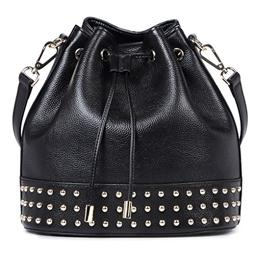

num of compare pictures:  100
compare pictures:


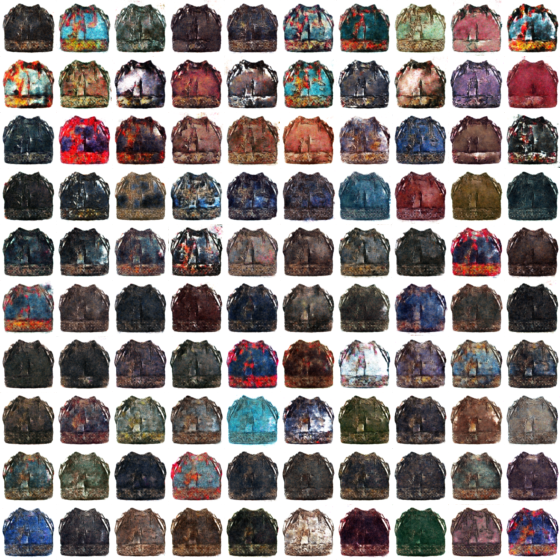

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


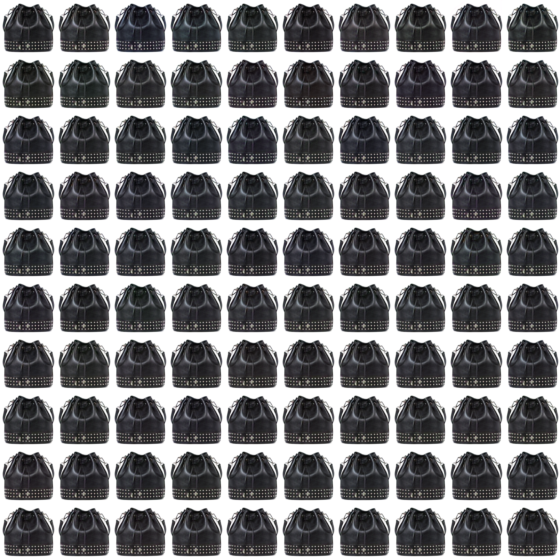

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case01
target picture:


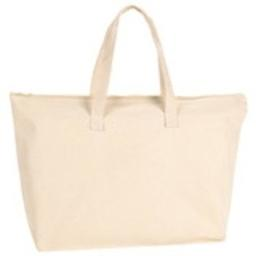

num of compare pictures:  100
compare pictures:


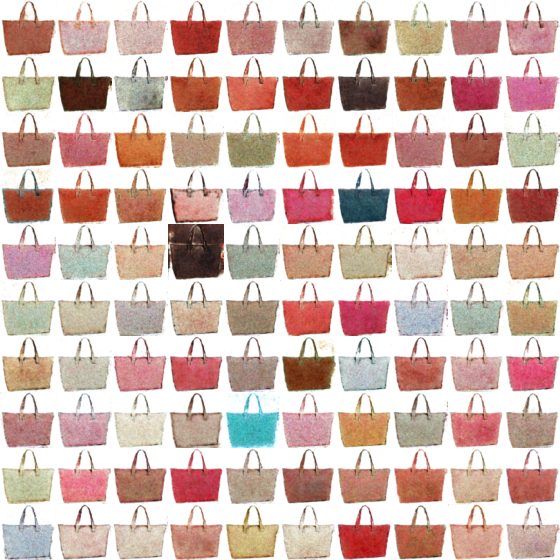

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


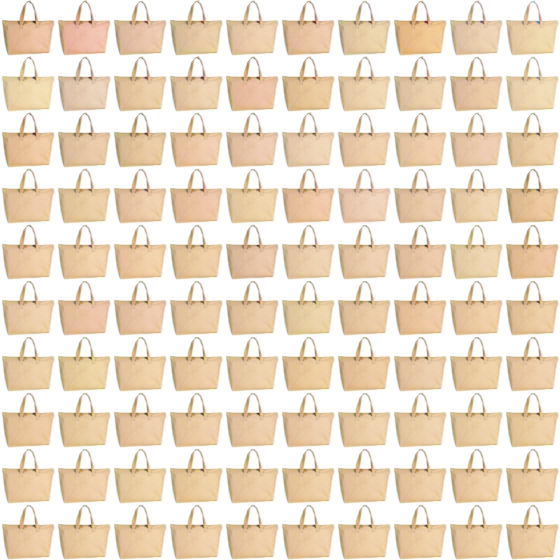

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case02
target picture:


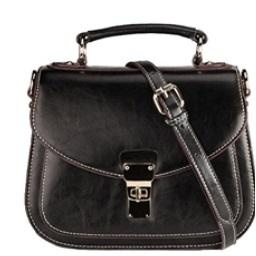

num of compare pictures:  100
compare pictures:


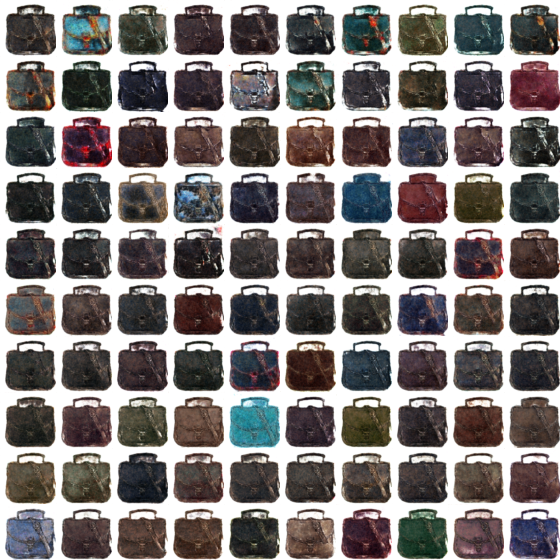

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


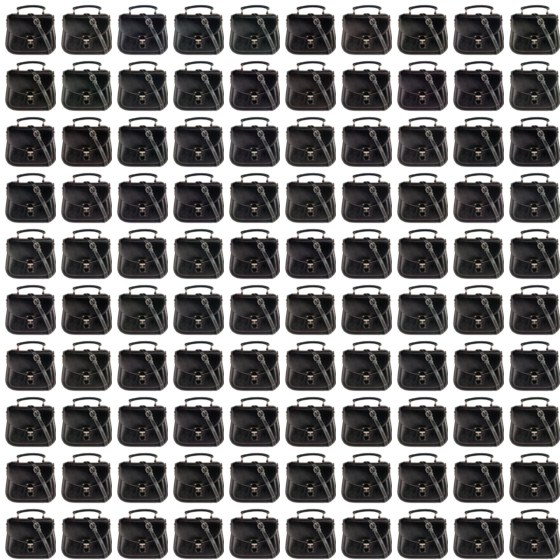

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case03
target picture:


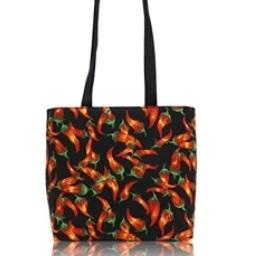

num of compare pictures:  100
compare pictures:


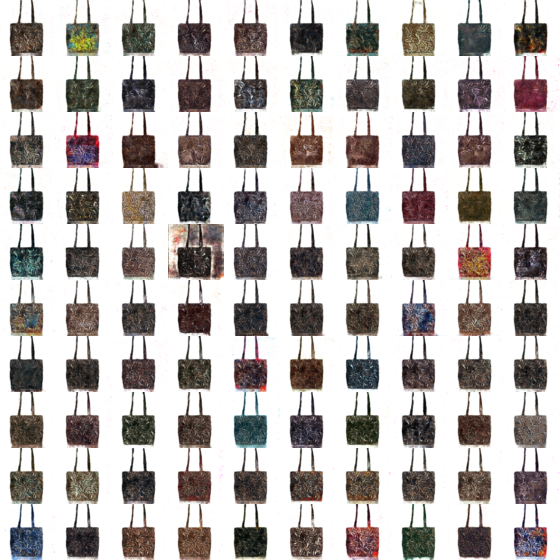

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


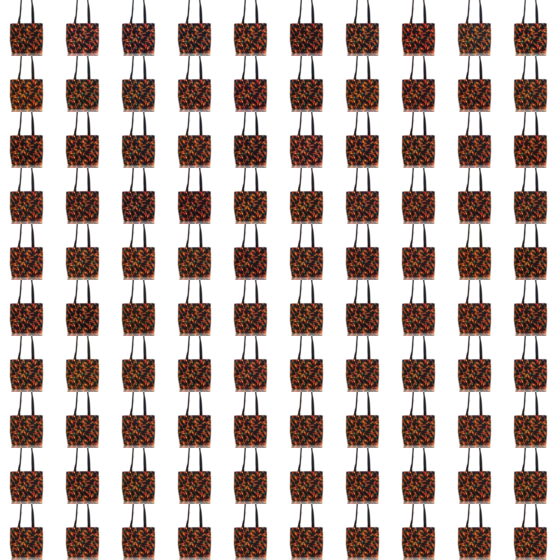

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case04
target picture:


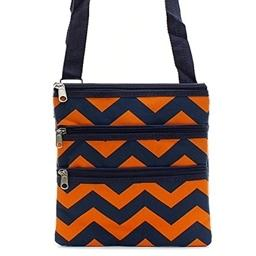

num of compare pictures:  100
compare pictures:


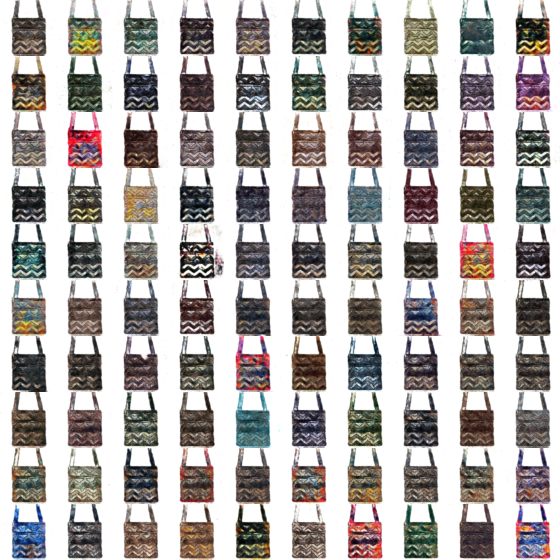

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


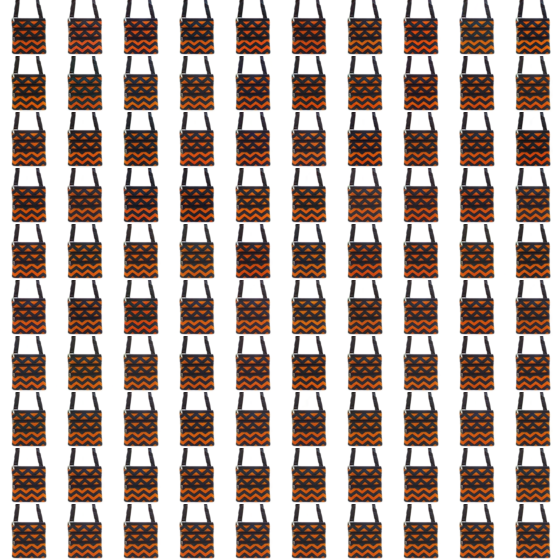

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case05
target picture:


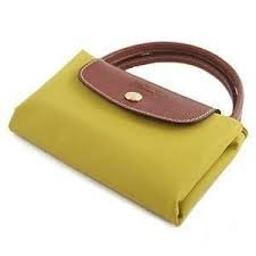

num of compare pictures:  100
compare pictures:


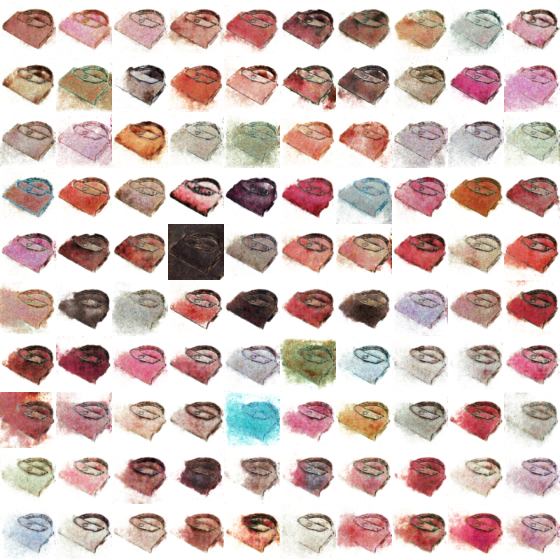

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


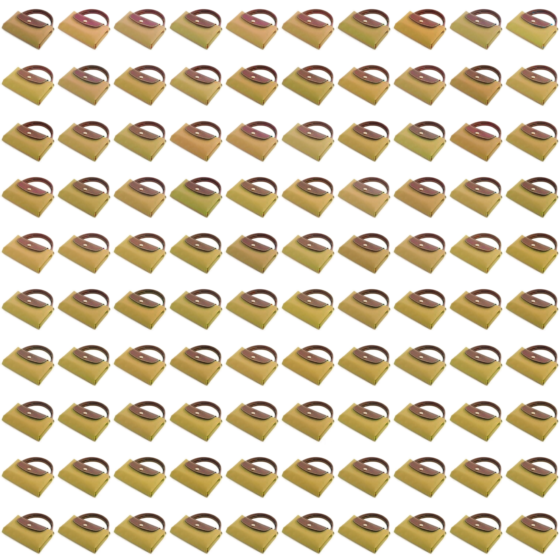

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case06
target picture:


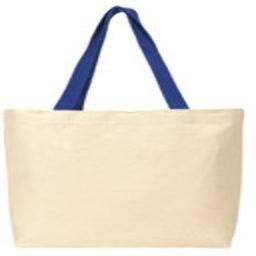

num of compare pictures:  100
compare pictures:


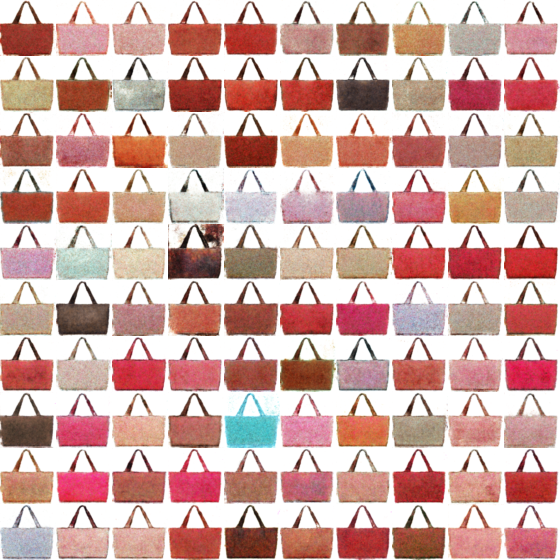

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


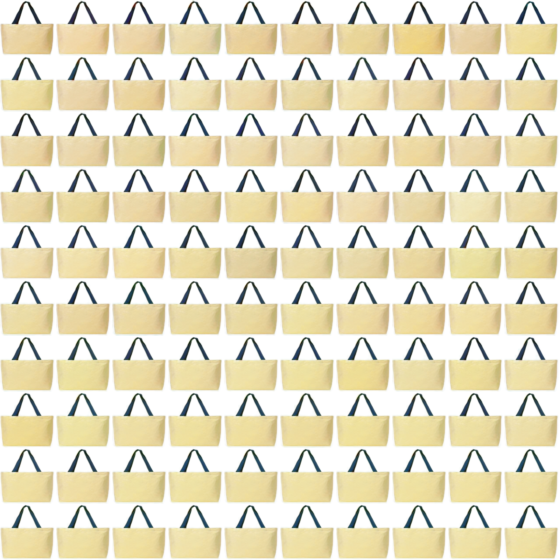

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case07
target picture:


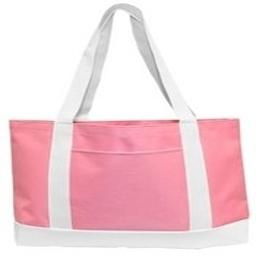

num of compare pictures:  100
compare pictures:


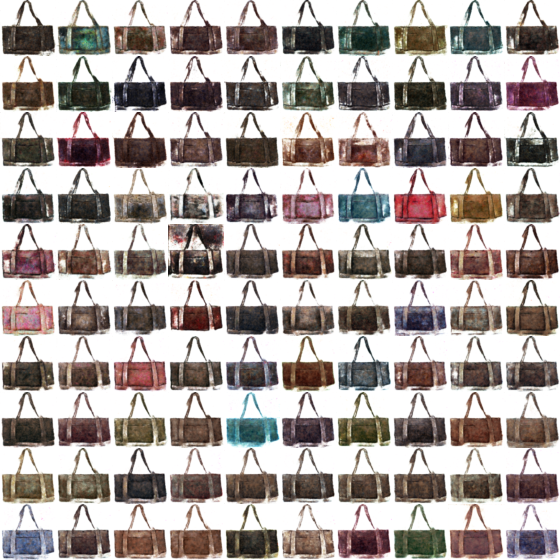

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


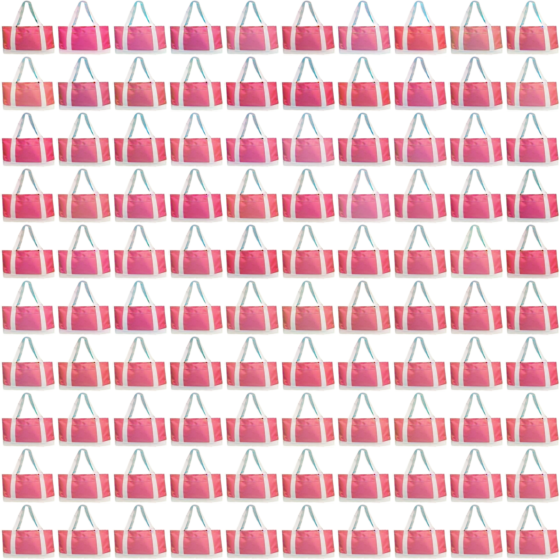

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case08
target picture:


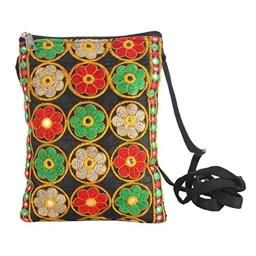

num of compare pictures:  100
compare pictures:


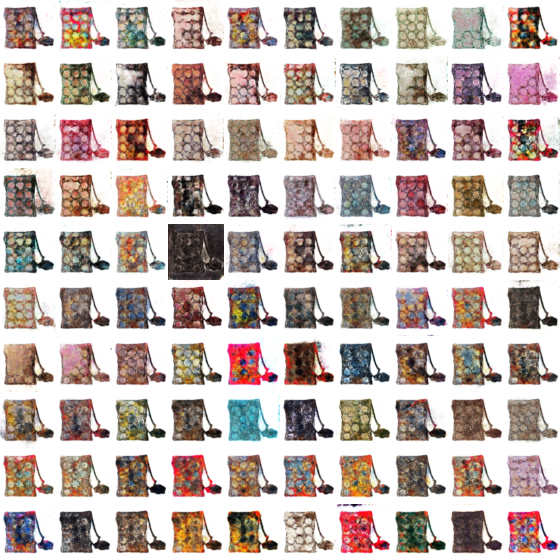

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


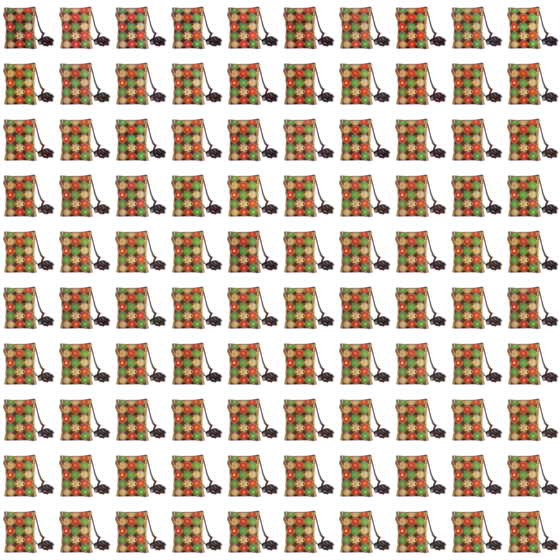

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case09
target picture:


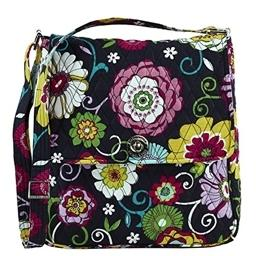

num of compare pictures:  100
compare pictures:


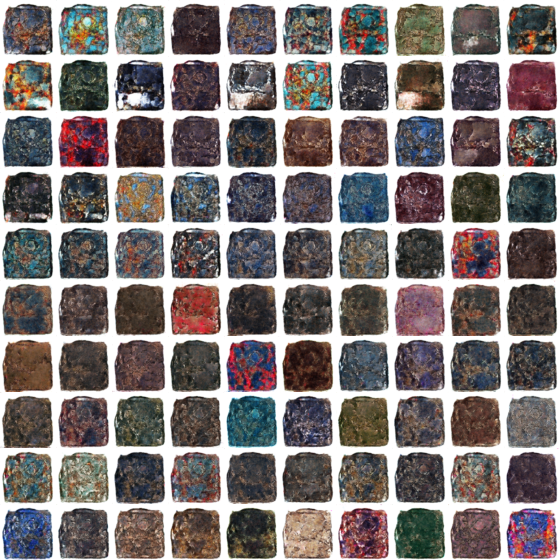

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


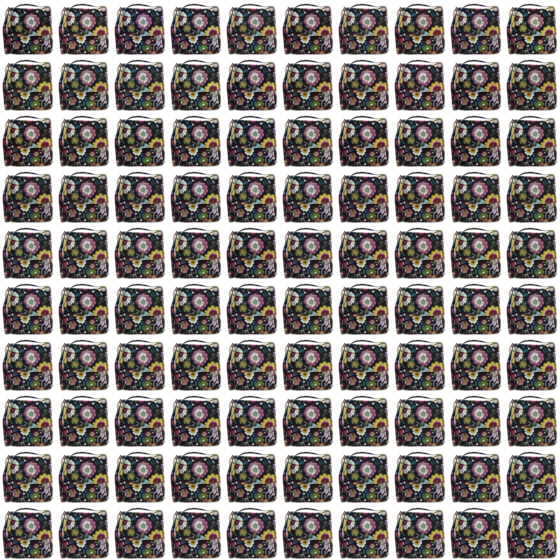

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
D:\GitHub\analysis_generated_pictures\category\recover_bag_color(from_sk)\case10
target picture:


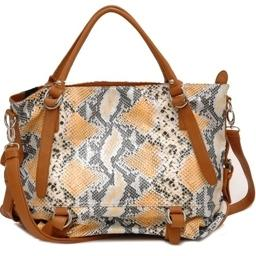

num of compare pictures:  100
compare pictures:


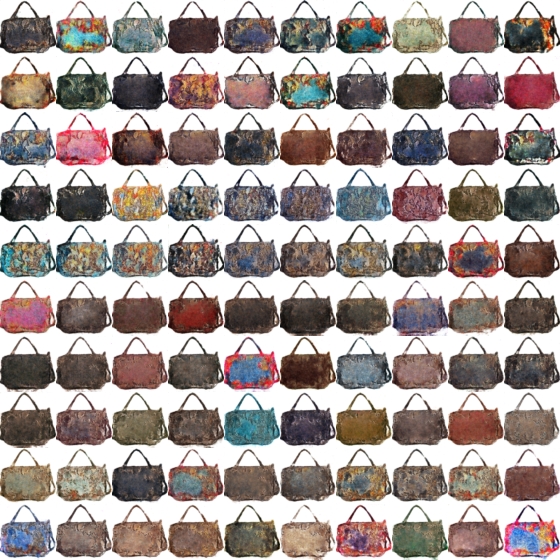

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]
num of compare pictures:  100
compare pictures:


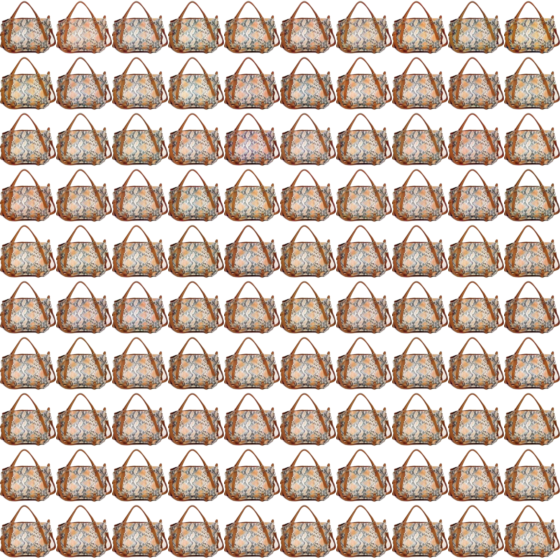

finish: [0/100]
finish: [10/100]
finish: [20/100]
finish: [30/100]
finish: [40/100]
finish: [50/100]
finish: [60/100]
finish: [70/100]
finish: [80/100]
finish: [90/100]


In [9]:
# file path

case_name_list = ["case00","case01","case02","case03","case04",
                 "case05","case06","case07","case08","case09",
                  "case10"]


experiment_type = "recover_bag_color(from_sk)" 
# recover_bag_color(from_sk)
# recover_bag_sk(from_color)

# case_name = "case01"

for case_name in case_name_list:    
    
    file_path = "D:\\GitHub\\analysis_generated_pictures\\category\\"+experiment_type+"\\"+case_name
    loop_calculation(file_path)
    

# plot

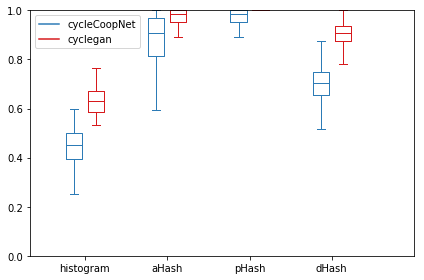

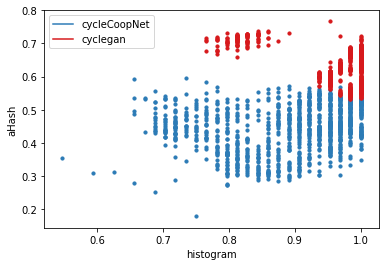

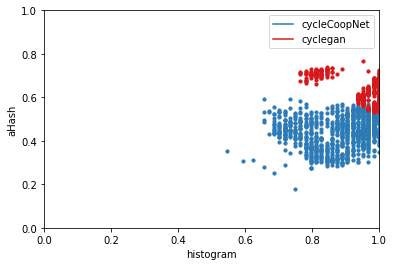

In [10]:
#-------------------------------------boxplot---------------------------------------# 

    data_coopnet = [coopnet_histogram_list, coopnet_aHash_list, coopnet_pHash_list, coopnet_dHash_list]
    data_cyclegan = [cyclegan_histogram_list, cyclegan_aHash_list, cyclegan_pHash_list, cyclegan_dHash_list]

    # ticks = ['case A', 'case B', 'case C']
    ticks = ['histogram', 'aHash', 'pHash', 'dHash']


    def set_box_color(bp, color):
        plt.setp(bp['boxes'], color=color)
        plt.setp(bp['whiskers'], color=color)
        plt.setp(bp['caps'], color=color)
        plt.setp(bp['medians'], color=color)

    plt.figure()


    bp_1 = plt.boxplot(data_coopnet, positions=np.array(range(len(data_coopnet)))*3.0-0.4, sym='', widths=0.6)
    bp_2 = plt.boxplot(data_cyclegan, positions=np.array(range(len(data_cyclegan)))*3.0+0.4, sym='', widths=0.6)
   
    set_box_color(bp_1, '#2C7BB6')
    set_box_color(bp_2, '#D7191C') # colors are from http://colorbrewer2.org/

    # draw temporary red and blue lines and use them to create a legend
    plt.plot([], c='#2C7BB6', label='cycleCoopNet')
    plt.plot([], c='#D7191C', label='cyclegan')
    plt.legend()

    plt.xticks(range(0, len(ticks) * 3, 3), ticks)
    plt.xlim(-2, len(ticks)*3)
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.savefig(file_path+"\\boxplot.png")
    plt.show()

#------------------------------------scatter_compare----------------------------------------# 

    #設定x軸範圍
    # plt.xlim(0,1)
    #設定y軸範圍
    # plt.ylim(0,1)

    plt.scatter(coopnet_aHash_list, coopnet_histogram_list, s=10, c='#2C7BB6')
    plt.scatter(cyclegan_aHash_list, cyclegan_histogram_list, s=10, c='#D7191C')

    # draw temporary red and blue lines and use them to create a legend
    plt.plot([], c='#2C7BB6', label='cycleCoopNet')
    plt.plot([], c='#D7191C', label='cyclegan')
    plt.xlabel("histogram")
    plt.ylabel("aHash")
    plt.legend()

    plt.savefig(file_path+"\\scatter_compare.png")
    plt.show()
    
#------------------------------------scatter_01----------------------------------------# 

    #設定x軸範圍
    plt.xlim(0,1)
    #設定y軸範圍
    plt.ylim(0,1)

    plt.scatter(coopnet_aHash_list, coopnet_histogram_list, s=10, c='#2C7BB6')
    plt.scatter(cyclegan_aHash_list, cyclegan_histogram_list, s=10, c='#D7191C')

    # draw temporary red and blue lines and use them to create a legend
    plt.plot([], c='#2C7BB6', label='cycleCoopNet')
    plt.plot([], c='#D7191C', label='cyclegan')
    plt.xlabel("histogram")
    plt.ylabel("aHash")
    plt.legend()

    plt.savefig(file_path+"\\scatter_01.png")
    plt.show()    
